In [1]:
import pathlib
base_path = pathlib.Path("../")

In [2]:
import torch
from torchvision import transforms
import json
import sys
sys.path.append(str(base_path))
from src.models.v1.model import AudioAutoEncoder
from src.models.v1.testing import testing
from src.dataloaders.v1.dataloader import AudioDB
from src.utils.utils import batch_dft_to_audio

[   INFO   ] MusicExtractorSVM: no classifier models were configured by default


In [3]:
data_path = base_path / 'audio/'
results_path = base_path / 'results/'
models_path = base_path / 'models/'

In [4]:
# Checking if gpu available
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

# Dataloader

In [5]:
# DataLoader
tr = transforms.Compose([
        transforms.ToTensor(), 
        ])

data_filename = data_path / "test_data.csv"

batch_size = 60
test_audios_db = AudioDB(data_filename,
                   data_path,
                   tr)

num_workers = 8

test_loader = torch.utils.data.DataLoader(dataset=test_audios_db,
                                           batch_size=batch_size, 
                                           shuffle=True,
                                           num_workers = num_workers)

# Loading model

In [6]:
# CHANGE ME!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
model_timestamp = "09-12-2022_21-53"
epoch = 15

# DON'T CHANGE!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
model_name = f"{model_timestamp}/model"
model_checkpoint_basename = models_path / f"{model_name}__epoch_{epoch}"
model_checkpoint_epoch = pathlib.Path(f"{model_checkpoint_basename}.ckpt")
model_loss_filename = pathlib.Path(f"{model_checkpoint_basename}_loss.npy")
model_hyperparams_filename = models_path / model_timestamp / "hyperparams.json"

with open(model_hyperparams_filename, "r") as f:
    model_hyperparams_dict = json.load(f)
autoencoder = AudioAutoEncoder(2, 32, 400)

In [7]:
assert model_checkpoint_epoch.exists()
assert model_loss_filename.exists()
assert model_hyperparams_filename.exists()

# Listening a batch and plot spectrogram

# Original

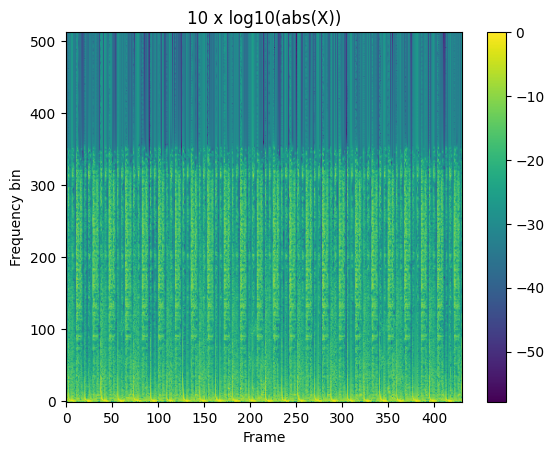

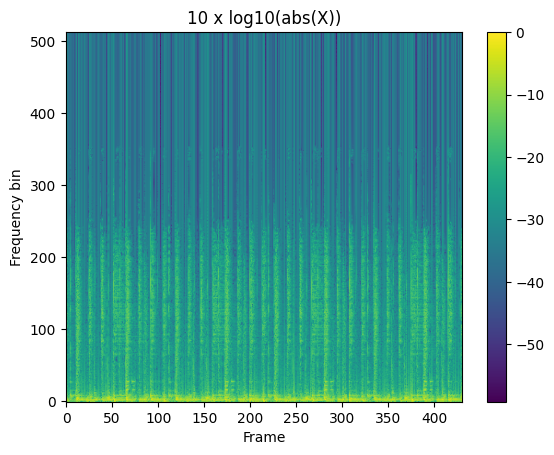

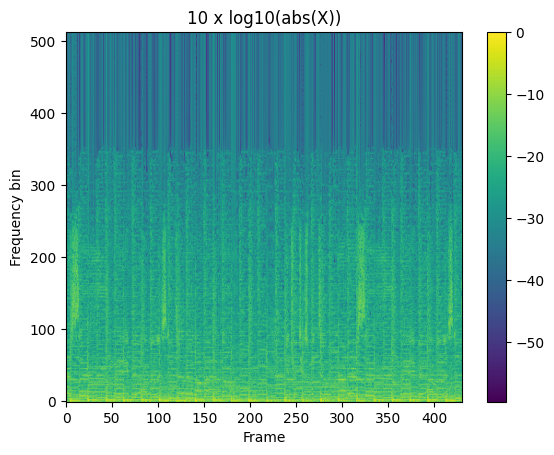

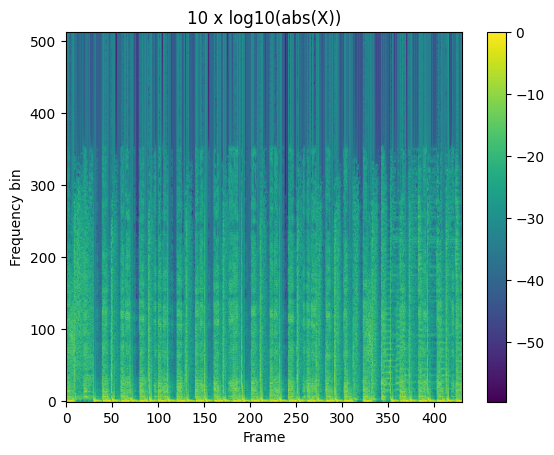

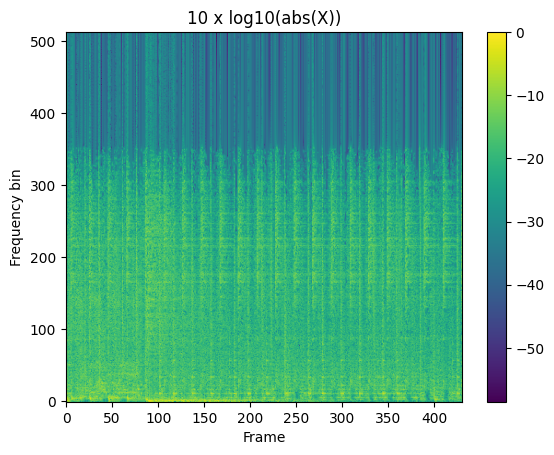

In [8]:
orig_dfts = next(iter(test_loader))

_ = batch_dft_to_audio(orig_dfts, listen=True, show_spectrogram=True)

# Synthesized

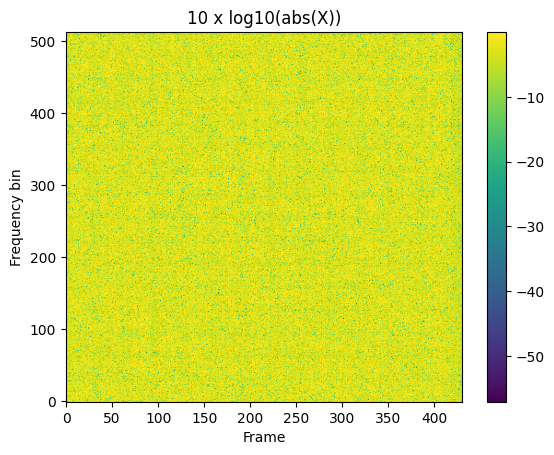

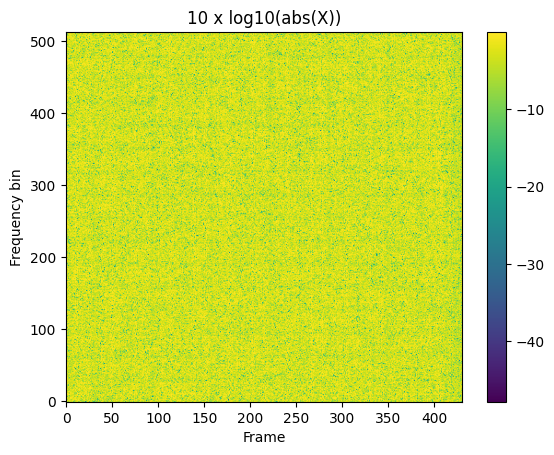

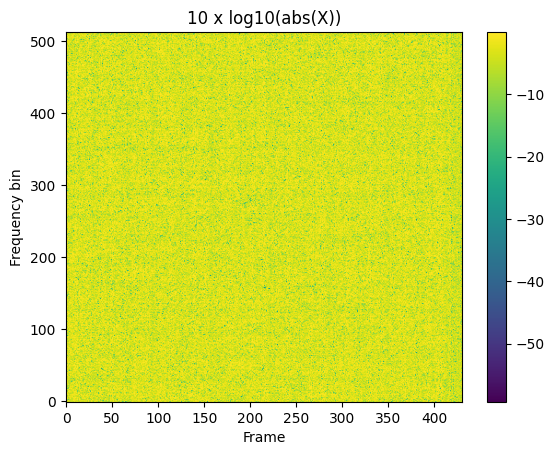

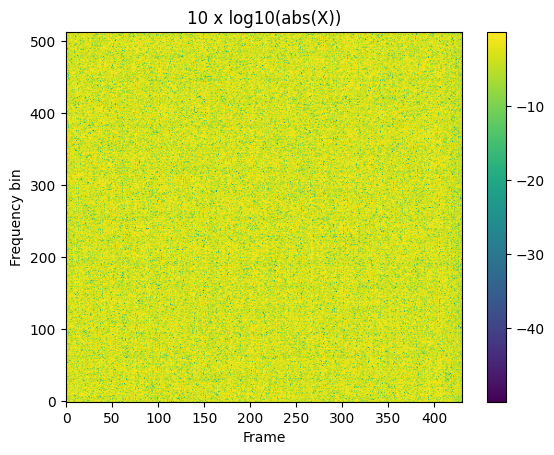

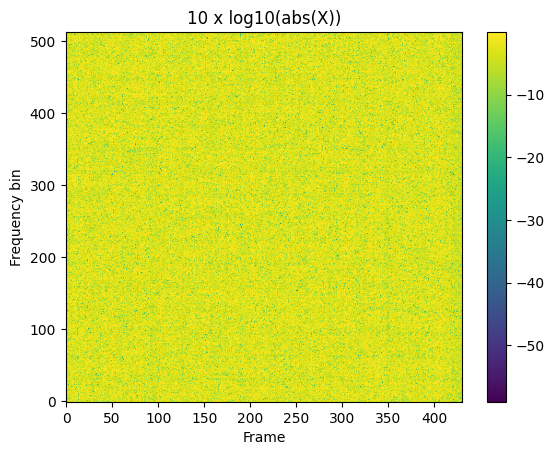

In [9]:
test_synth = autoencoder(orig_dfts)

_ = batch_dft_to_audio(test_synth, listen=True, show_spectrogram=True)

# Loss

In [10]:
loss = testing(autoencoder,
               test_loader,
               device,
               model_hyperparams_dict["lambda"])

Running testing...


In [11]:
print(loss)

2.146363761208274
